# Notebook: NANSNet version 1

In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import progressbar
from csv import writer
import numpy as np
import random
import tensorflow as tf

import pickle
from pickle import dump

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten, Input, LSTM,LeakyReLU,Bidirectional
from tensorflow.keras.layers import Embedding, Concatenate,Conv2D,MaxPooling2D,Multiply,Conv1D
from tensorflow.keras.layers import GlobalMaxPooling2D,BatchNormalization,Conv1D,MaxPooling1D
from tensorflow.keras.layers import GlobalMaxPooling1D,GlobalMaxPooling1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model,Sequential,load_model 
import tensorflow.keras
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from tensorflow.keras.utils import plot_model,to_categorical
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow.keras.backend as K
from tensorflow.keras.mixed_precision import experimental as mixed_precision
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_policy(policy)
tf.executing_eagerly()

import cv2
import matplotlib.pyplot as plt
import imutils

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: GeForce RTX 2080 Ti, compute capability 7.5
Instructions for updating:
Use tf.keras.mixed_precision.LossScaleOptimizer instead. LossScaleOptimizer now has all the functionality of DynamicLossScale


In [2]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [3]:
num_classes=1000


# Load prepared data

In [4]:
#data=pd.read_csv("answersOneHot"+str(num_classes)+".csv")
data=pd.read_csv("answersArgMax"+str(num_classes)+".csv")

In [5]:
file= open("questions"+str(num_classes)+".pickle","rb")
questions=pickle.load(file)
questions=questions[:len(data)]
file.close()

In [6]:
file= open("questions_char"+str(num_classes)+".pickle","rb")
questions_char=pickle.load(file)
questions_char=questions_char[:len(data)]
file.close()

In [7]:
file= open("imageIds"+str(num_classes)+".pickle","rb")
imIds=pickle.load(file)
imIds=imIds[:len(data)]
file.close()


# Check if everything was loaded propperly

In [8]:
print(len(imIds),"imIds")
print(imIds.head(5))
print(len(questions),"questions")
print(questions.head(5))
print(len(questions_char),"questions_char")
print(questions_char.head(5))
print(len(data),"data")
print(data.head(5))

578452 imIds
   imgIds
0  458752
1  458752
2  458752
3  458752
4  262146
578452 questions
   0  1  2  3  4  5  6  7  8  9  ...  13  14  15  16  17   18  19   20   21  \
0  0  0  0  0  0  0  0  0  0  0  ...   0   0   0   3   2    5  27   76  102   
1  0  0  0  0  0  0  0  0  0  0  ...   0   0   0   0   3  595   2    5   15   
2  0  0  0  0  0  0  0  0  0  0  ...   0   0   0   0   3   12   2    1  322   
3  0  0  0  0  0  0  0  0  0  0  ...   0   0   0   2   5   15   8  392  356   
4  0  0  0  0  0  0  0  0  0  0  ...   0   0   0   0   0    3  12    2    1   

    22  
0  451  
1   60  
2   53  
3  208  
4  196  

[5 rows x 23 columns]
578452 questions_char
   0  1  2  3  4  5  6  7  8  9  ...  90  91  92  93  94  95  96  97  98  99
0  0  0  0  0  0  0  0  0  0  0  ...  16   1   3   4  10   8  20  16   4  11
1  0  0  0  0  0  0  0  0  0  0  ...   9   1  17  13   5  19   6   9  16  11
2  0  0  0  0  0  0  0  0  0  0  ...   2  10   7   1   7   4   6  10   3  11
3  0  0  0  0  0  0  0  0  0

In [9]:
relation=389975 # train/validation split

imIdsTrain=imIds.loc[:relation-1]
imIdsTrain=imIdsTrain.reset_index().drop(["index"],axis=1)
print(len(imIdsTrain),"imIdsTrain")

questionsTrain=questions.loc[:relation-1]
questionsTrain=questionsTrain.reset_index().drop(["index"],axis=1)
print(len(questionsTrain),"questionsTrain")

questions_charTrain=questions_char.loc[:relation-1]
questions_charTrain=questions_charTrain.reset_index().drop(["index"],axis=1)
print(len(questions_charTrain),"questions_charTrain")

dataTrain=data.loc[:relation-1]
dataTrain=dataTrain.reset_index().drop(["index"],axis=1)
print(len(dataTrain),"dataTrain")

imIdsVal=imIds.loc[relation:]
imIdsVal=imIdsVal.reset_index().drop(["index"],axis=1)
print(len(imIdsVal),"imIdsVal")

questionsVal=questions.loc[relation:]
questionsVal=questionsVal.reset_index().drop(["index"],axis=1)
print(len(questionsVal),"questionsVal")

questions_charVal=questions_char.loc[relation:]
questions_charVal=questions_charVal.reset_index().drop(["index"],axis=1)
print(len(questions_charVal),"questions_charVal")

dataVal=data.loc[relation:]
dataVal=dataVal.reset_index().drop(["index"],axis=1)
print(len(dataVal),"dataVal")

389975 imIdsTrain
389975 questionsTrain
389975 questions_charTrain
389975 dataTrain
188477 imIdsVal
188477 questionsVal
188477 questions_charVal
188477 dataVal


In [10]:
imIdsTrain.head()
print(imIdsTrain.loc[389974])

imgIds    524286
Name: 389974, dtype: int64


## Load tokenizers

In [11]:
file= open("tokenizer"+str(num_classes)+".pickle","rb")
tokenizer=pickle.load(file)
file.close()

In [12]:
file= open("tokenizer_onehot"+str(num_classes)+".pickle","rb")
print("tokenizer_onehot"+str(num_classes)+".pickle")
tokenizer_onehot=pickle.load(file)
file.close()

tokenizer_onehot1000.pickle


In [13]:
file= open("tokenizer_char"+str(num_classes)+".pickle","rb")
print("tokenizer_char"+str(num_classes)+".pickle")
tokenizer_char=pickle.load(file)
file.close()

tokenizer_char1000.pickle


## This part is used for checking if answers, questions and pictures are suited to each other
## Lets test, if everething was loaded correctly,


In [14]:
num =0#409401
perfix="../VQA_data/validationSet/val2014/COCO_val2014_000000"


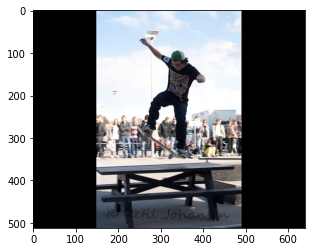

In [15]:
img = cv2.imread(perfix+str(np.asarray(imIdsVal)[num,0]).zfill(6)+".jpg")
#img = cv2.imread(perfix+str(np.asarray(imIdsTrain)[num,0]).zfill(6)+".jpg")
#print(perfix+str(np.asarray(imIdsTrain)[num,0]).zfill(6)+".jpg")
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
plt.imshow(img)

In [16]:
print("question:",tokenizer.sequences_to_texts([np.asarray(questionsVal)[num]]))
#print("question:",tokenizer.sequences_to_texts([np.asarray(questionsTrain)[num]]))

question: ['where is he looking']


In [17]:
print("question_char:",tokenizer_char.sequences_to_texts([np.asarray(questions_charVal)[num]]))
#print("question_char:",tokenizer.sequences_to_texts([np.asarray(questions_charTrain)[num]]))

question_char: ['w h e r e   i s   h e   l o o k i n g ?']


In [18]:

print("answer:",tokenizer_onehot.sequences_to_texts([dataVal.loc[num]]))
#print("answer:",tokenizer_onehot.sequences_to_texts([[int(np.argmax(np.asarray(dataTrain)[num]))]]))

answer: ['down']


# Parameters

In [19]:
network_size=(331,331)
batch_size=128
#intType="uint16"
floatType="float32"
tfType=tf.float32

# Create Data Generator

#### https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly

In [20]:
class DataGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs,questions,questions_char, answers, batch_size=256, dim=(224,224), n_channels=3,
                 n_classes=1000, shuffle=True,name="train"):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.questions=questions
        self.questions_char=questions_char
        self.answers = answers
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()
        if name=="train":
            self.perfix="../VQA_data/trainSet/train2014/COCO_train2014_000000"
            print("train",self.perfix)
        if name=="validation":
            self.perfix="../VQA_data/validationSet/val2014/COCO_val2014_000000"
            print("validation",self.perfix)

        self.name=name
        print(len(self.list_IDs),"self.list_IDs")
        print(len(self.questions),"self.questions")
        print(len(questions_char),"questions_char")
        print(len(self.answers),"self.answers")

        print("self.questions.dtype: ",self.questions.dtype )
        print("self.questions_char.dtype: ",self.questions_char.dtype )
        print("self.answers.dtype: ",self.answers.dtype,"\n" )

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        #print(index)
        # Find list of IDs
        list_IDs_temp=[]
        list_answs_temp=[]
        list_quests_temp=[]
        list_quests_char_temp=[]
        for k in indexes:
            list_IDs_temp.append(self.list_IDs[k][0])
            list_answs_temp.append(to_categorical(self.answers[k], num_classes=num_classes)[0])
            #list_answs_temp.append(self.answers[k])
            list_quests_temp.append(self.questions[k])
            list_quests_char_temp.append(self.questions_char[k])
        # Generate data
        X, y = self.__data_generation(list_IDs_temp,list_answs_temp,list_quests_temp,list_quests_char_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        self.counter=0
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp,list_answs_temp,list_quests_temp,list_quests_char_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        embX = np.empty((self.batch_size, 23))
        emb_charX = np.empty((self.batch_size, 100))
        y = np.empty((self.batch_size,num_classes))
        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            
            
            img = cv2.imread(self.perfix+str(ID).zfill(6)+".jpg")
            img = cv2.resize(img, network_size) 
            
            #img = load_img(perfix+str(imIdsVal.loc[num][0]).zfill(6)+".jpg", target_size=network_size)
            #img = img_to_array(img)
            if self.name=="train":
                img = imutils.rotate(img, angle=random.randrange(-5, 5))
         

            X[i,] = tf.keras.applications.nasnet.preprocess_input(img)            
            embX[i]=list_quests_temp[i]
            emb_charX[i]=list_quests_char_temp[i]
            y[i] = list_answs_temp[i]
            #print(np.argmax(list_answs_temp[i]))
            #print("question:",tokenizer.sequences_to_texts([list_quests_temp[i]]))
            #print("answer:",tokenizer_onehot.sequences_to_texts([[int(np.argmax(list_answs_temp[i]))]]))
            
            self.counter+=1
        return [X,embX,emb_charX], y

# Training

## Pretrain language model only. It is also interesting to see a base line. What could be done only with text.

In [21]:
question_input = Input(shape=(23,))
encoded_question = Embedding(input_dim=18702, output_dim=50, input_length=23)(question_input)
encoded_question = Bidirectional(LSTM(256, return_sequences=True))(encoded_question)
encoded_question=LeakyReLU()(encoded_question)

encoded_question=Conv1D(64*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(64*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)

encoded_question=Conv1D(128*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)

encoded_question=Conv1D(128*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)


encoded_question=Conv1D(256*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(256*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)

encoded_question=Conv1D(512*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(512*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)


encoded_question=Flatten()(encoded_question)



In [22]:
question_input_char = Input(shape=(100,))
encoded_question_char = Embedding(input_dim=62, output_dim=70, input_length=100)(question_input_char)
encoded_question_char = Bidirectional(LSTM(256, return_sequences=False))(encoded_question_char)
encoded_question_char=LeakyReLU()(encoded_question_char)

encoded_question_char = Dense(256)(encoded_question_char)
encoded_question_char = BatchNormalization()(encoded_question_char)
encoded_question_char = Activation("relu")(encoded_question_char)



In [24]:
encoded_question_concatenate = Concatenate()([encoded_question,encoded_question_char])
encoded_question_concatenate = Dense(7744)(encoded_question_concatenate) # this number will be used for merging 
                                                                         # with vision model 
encoded_question_concatenate = Dropout(0.5)(encoded_question_concatenate)
encoded_question_concatenate = BatchNormalization()(encoded_question_concatenate)
encoded_question_concatenate = Activation("relu")(encoded_question_concatenate)


In [25]:
encoded_question_concatenate = Dense(num_classes, activation='softmax',dtype="float32")(encoded_question_concatenate)
text_only_model = Model(inputs=[question_input,question_input_char], outputs=encoded_question_concatenate)

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 23)]         0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 23, 50)       935100      input_1[0][0]                    
__________________________________________________________________________________________________
bidirectional (Bidirectional)   (None, 23, 512)      628736      embedding[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 23, 512)      0           bidirectional[0][0]              
______________________________________________________________________________________________

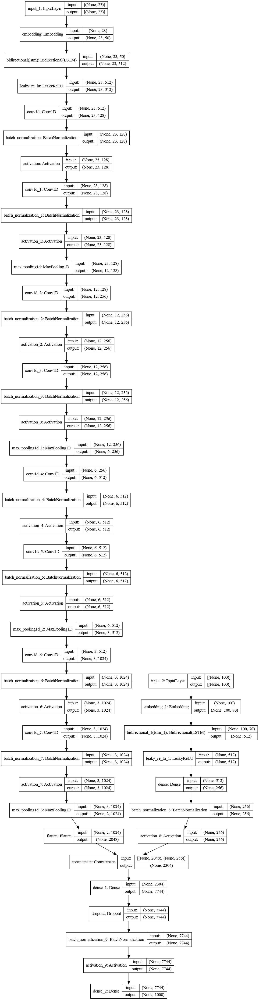

In [26]:
mcp_save = ModelCheckpoint("NASNet/NASNet_text_only.h5", monitor='val_loss', mode='min', verbose=2,save_best_only=True)
text_only_model.summary()
plot_model(text_only_model,show_shapes=True, to_file="NASNet/NASNet_text_only_"+str(num_classes)+".png")

In [27]:
reduce_lr= ReduceLROnPlateau(monitor='val_loss',factor=np.sqrt(0.1),patience=3, min_lr=0.5e-6)
recall=tf.keras.metrics.Recall()
precision=tf.keras.metrics.Precision()
auc=tf.keras.metrics.AUC()

optimizer=tf.keras.optimizers.SGD()#(lr=0.0005, rho=0.9, epsilon=None, decay=0.0)
text_only_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=["categorical_crossentropy",'accuracy',recall,precision]) #rmsprop -

  opt = tf.keras.mixed_precision.experimental.LossScaleOptimizer(opt)



In [28]:
history=text_only_model.fit([np.asarray(questionsTrain),np.asarray(questions_charTrain)],np.asarray(dataTrain), validation_data=([np.asarray(questionsVal),np.asarray(questions_charVal)],np.asarray(dataVal)),callbacks=[mcp_save,reduce_lr],epochs=75,batch_size=2048)

Epoch 1/75
191/191 [==============================] - 46s 194ms/step - loss: 4.2954 - categorical_crossentropy: 4.2954 - accuracy: 0.2308 - recall: 0.1696 - precision: 0.4461 - val_loss: 6.4669 - val_categorical_crossentropy: 6.4669 - val_accuracy: 0.0042 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00

Epoch 00001: val_loss improved from inf to 6.46691, saving model to NASNet/NASNet_text_only.h5
Epoch 2/75
191/191 [==============================] - 35s 185ms/step - loss: 3.1248 - categorical_crossentropy: 3.1248 - accuracy: 0.2793 - recall: 0.2202 - precision: 0.4789 - val_loss: 6.6132 - val_categorical_crossentropy: 6.6132 - val_accuracy: 0.0042 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00

Epoch 00002: val_loss did not improve from 6.46691
Epoch 3/75
191/191 [==============================] - 36s 191ms/step - loss: 2.9098 - categorical_crossentropy: 2.9098 - accuracy: 0.2912 - recall: 0.2200 - precision: 0.4851 - val_loss: 5.9317 - val_categorical_crossentropy: 5.9317 -

191/191 [==============================] - 34s 181ms/step - loss: 2.9217 - categorical_crossentropy: 2.9217 - accuracy: 0.3425 - recall: 0.2296 - precision: 0.5203 - val_loss: 3.0501 - val_categorical_crossentropy: 3.0501 - val_accuracy: 0.3465 - val_recall: 0.0249 - val_precision: 0.5406

Epoch 00023: val_loss did not improve from 2.92363
Epoch 24/75
191/191 [==============================] - 35s 181ms/step - loss: 2.9020 - categorical_crossentropy: 2.9020 - accuracy: 0.3428 - recall: 0.2299 - precision: 0.5201 - val_loss: 3.0213 - val_categorical_crossentropy: 3.0213 - val_accuracy: 0.3464 - val_recall: 0.0230 - val_precision: 0.5391

Epoch 00024: val_loss did not improve from 2.92363
Epoch 25/75
191/191 [==============================] - 35s 181ms/step - loss: 2.9348 - categorical_crossentropy: 2.9348 - accuracy: 0.3417 - recall: 0.2296 - precision: 0.5192 - val_loss: 3.0288 - val_categorical_crossentropy: 3.0288 - val_accuracy: 0.3460 - val_recall: 0.0235 - val_precision: 0.5178

E

191/191 [==============================] - 35s 181ms/step - loss: 2.9058 - categorical_crossentropy: 2.9058 - accuracy: 0.3405 - recall: 0.2281 - precision: 0.5149 - val_loss: 3.0298 - val_categorical_crossentropy: 3.0298 - val_accuracy: 0.3466 - val_recall: 0.0256 - val_precision: 0.5212

Epoch 00046: val_loss did not improve from 2.92363
Epoch 47/75
191/191 [==============================] - 35s 181ms/step - loss: 2.9001 - categorical_crossentropy: 2.9001 - accuracy: 0.3430 - recall: 0.2309 - precision: 0.5204 - val_loss: 3.0262 - val_categorical_crossentropy: 3.0262 - val_accuracy: 0.3466 - val_recall: 0.0255 - val_precision: 0.5216

Epoch 00047: val_loss did not improve from 2.92363
Epoch 48/75
191/191 [==============================] - 35s 181ms/step - loss: 2.9013 - categorical_crossentropy: 2.9013 - accuracy: 0.3420 - recall: 0.2298 - precision: 0.5184 - val_loss: 3.0233 - val_categorical_crossentropy: 3.0233 - val_accuracy: 0.3466 - val_recall: 0.0262 - val_precision: 0.5257

E

KeyboardInterrupt: 

## if you have any models which training process was interrupted, you can load it here

# Adding Vision Model

### Creating text model and load weights from text_only_model

In [21]:
question_input = Input(shape=(23,))
encoded_question = Embedding(input_dim=18702, output_dim=150, input_length=23)(question_input)
encoded_question = Bidirectional(LSTM(256, return_sequences=True))(encoded_question)
encoded_question=LeakyReLU()(encoded_question)

encoded_question=Conv1D(64*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(64*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)

encoded_question=Conv1D(128*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)

encoded_question=Conv1D(128*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)


encoded_question=Conv1D(256*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(256*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)

encoded_question=Conv1D(512*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(512*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)


encoded_question=Flatten()(encoded_question)

question_input_char = Input(shape=(100,))
encoded_question_char = Embedding(input_dim=62, output_dim=70, input_length=100)(question_input_char)
encoded_question_char = Bidirectional(LSTM(256, return_sequences=False))(encoded_question_char)
encoded_question_char=LeakyReLU()(encoded_question_char)

encoded_question_char = Dense(256)(encoded_question_char)
encoded_question_char = BatchNormalization()(encoded_question_char)
encoded_question_char = Activation("relu")(encoded_question_char)


encoded_question_concatenate = Concatenate()([encoded_question,encoded_question_char])
encoded_question_concatenate = Dense(3456)(encoded_question_concatenate)
encoded_question_concatenate = Dropout(0.5)(encoded_question_concatenate)
encoded_question_concatenate = BatchNormalization()(encoded_question_concatenate)
encoded_question_concatenate = Activation("relu")(encoded_question_concatenate)

text_model = Model(inputs=[question_input,question_input_char], outputs=encoded_question_concatenate)

#text_model_layers=[]

### set weights from pretrained text model
#for i in range(len(text_model.layers)):
#    text_model.layers[i].set_weights(text_only_model.layers[i].get_weights())

## NASNet Vision Model

In [22]:
image_input=Input(shape=(network_size[0],network_size[1],3))
base_model=tf.keras.applications.NASNetLarge(input_shape=(network_size[0], network_size[1], 3), include_top=False, pooling="None",weights='imagenet', input_tensor=image_input)
base_model = Model(inputs=[base_model.input], outputs=base_model.output)
print("base_model.layers len: ",len(base_model.layers))
for i,layer in enumerate(base_model.layers):
    #if i<240:
    layer.trainable = False
image_model=base_model.output
image_model= Conv2D(96,kernel_size=(1,1),strides=(1,1),activation="relu",padding="same")(image_model)
image_model = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='same')(image_model)

base_model_layers=[]
for layer in base_model.layers:
    base_model_layers.append(layer.name)

base_model.layers len:  1039


In [23]:
image_model=Flatten()(image_model)

#base_model.summary()

### concatenate models

In [24]:
# Combine Vision_model and text_model to create the final model

merged=Multiply()([image_model,text_model.output])

merged=Dense(2048)(merged)
merged = Dropout(0.5)(merged)
merged=BatchNormalization()(merged)
merged=LeakyReLU()(merged)

merged=Dense(2048)(merged)
merged = Dropout(0.5)(merged)
merged=BatchNormalization()(merged)
merged=LeakyReLU()(merged)

merged=Dense(1000, activation='softmax')(merged)

vqa_model = Model(inputs=[base_model.input,question_input,question_input_char], outputs=merged)



In [25]:

plot_model(vqa_model,show_shapes=True, to_file="NASNet/NASNet_text_and_vision.png")

In [26]:
vqa_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 331, 331, 3) 0                                            
__________________________________________________________________________________________________
stem_conv1 (Conv2D)             (None, 165, 165, 96) 2592        input_3[0][0]                    
__________________________________________________________________________________________________
stem_bn1 (BatchNormalization)   (None, 165, 165, 96) 384         stem_conv1[0][0]                 
__________________________________________________________________________________________________
activation_10 (Activation)      (None, 165, 165, 96) 0           stem_bn1[0][0]                   
____________________________________________________________________________________________

Total params: 117,528,898
Trainable params: 32,588,784
Non-trainable params: 84,940,114
__________________________________________________________________________________________________


In [27]:
for i,layer in enumerate(vqa_model.layers):
    print(" layer.name = ",layer.name, layer.trainable)

 layer.name =  input_3 False
 layer.name =  stem_conv1 False
 layer.name =  stem_bn1 False
 layer.name =  activation_10 False
 layer.name =  reduction_conv_1_stem_1 False
 layer.name =  reduction_bn_1_stem_1 False
 layer.name =  activation_11 False
 layer.name =  activation_13 False
 layer.name =  separable_conv_1_pad_reduction_left1_stem_1 False
 layer.name =  separable_conv_1_pad_reduction_right1_stem_1 False
 layer.name =  separable_conv_1_reduction_left1_stem_1 False
 layer.name =  separable_conv_1_reduction_right1_stem_1 False
 layer.name =  separable_conv_1_bn_reduction_left1_stem_1 False
 layer.name =  separable_conv_1_bn_reduction_right1_stem_1 False
 layer.name =  activation_12 False
 layer.name =  activation_14 False
 layer.name =  separable_conv_2_reduction_left1_stem_1 False
 layer.name =  separable_conv_2_reduction_right1_stem_1 False
 layer.name =  activation_15 False
 layer.name =  separable_conv_2_bn_reduction_left1_stem_1 False
 layer.name =  separable_conv_2_bn_reduct

In [37]:
del text_only_model  #free place

## Validate on 1/3 of the data

In [28]:
size_value=331
network_size=(size_value,size_value)#(224,224)
batch_size= 64

paramsT = {'dim': network_size,
          'batch_size': batch_size,
          'n_classes': num_classes,
          'n_channels': 3,
          'shuffle': True,
            "name":"train"
          }

paramsV = {'dim': network_size,
          'batch_size': batch_size,
          'n_classes': num_classes,
          'n_channels': 3,
          'shuffle': True,
           "name":"validation"
          }

training_generator = DataGenerator(np.asarray(imIdsTrain)[:150000], np.asarray(questionsTrain)[:150000],np.asarray(questions_charTrain)[:150000],np.asarray(dataTrain)[:150000], **paramsT)
validation_generator = DataGenerator(np.asarray(imIdsVal)[:100000], np.asarray(questionsVal)[:100000],np.asarray(questions_charVal)[:100000],np.asarray(dataVal)[:100000], **paramsV)
training_generator_full = DataGenerator(np.asarray(imIdsTrain), np.asarray(questionsTrain),np.asarray(questions_charTrain),np.asarray(dataTrain), **paramsT)
validation_generator_full = DataGenerator(np.asarray(imIdsVal), np.asarray(questionsVal),np.asarray(questions_charVal),np.asarray(dataVal), **paramsV)

train ../VQA_data/trainSet/train2014/COCO_train2014_000000
150000 self.list_IDs
150000 self.questions
150000 questions_char
150000 self.answers
self.questions.dtype:  int64
self.questions_char.dtype:  int64
self.answers.dtype:  int64 

validation ../VQA_data/validationSet/val2014/COCO_val2014_000000
100000 self.list_IDs
100000 self.questions
100000 questions_char
100000 self.answers
self.questions.dtype:  int64
self.questions_char.dtype:  int64
self.answers.dtype:  int64 

train ../VQA_data/trainSet/train2014/COCO_train2014_000000
389975 self.list_IDs
389975 self.questions
389975 questions_char
389975 self.answers
self.questions.dtype:  int64
self.questions_char.dtype:  int64
self.answers.dtype:  int64 

validation ../VQA_data/validationSet/val2014/COCO_val2014_000000
188477 self.list_IDs
188477 self.questions
188477 questions_char
188477 self.answers
self.questions.dtype:  int64
self.questions_char.dtype:  int64
self.answers.dtype:  int64 



In [29]:
reduce_lr= ReduceLROnPlateau(monitor='val_loss',factor=np.sqrt(0.1),patience=3, min_lr=0.5e-6)
recall=tf.keras.metrics.Recall()
precision=tf.keras.metrics.Precision()
auc=tf.keras.metrics.AUC()

## Training will take couple of nights, untill some resoults could be observed

In [30]:
mcp_save = ModelCheckpoint('NASNet/NASNet_vision_blocked.h5', monitor='val_accuracy', mode='max', verbose=2,save_best_only=True)
optimizer=tf.keras.optimizers.SGD(lr=0.01) # if you restart the training of already trained model, change lr to 0.001, 0.0001 a s.o.
vqa_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy',recall,precision])


  opt = tf.keras.mixed_precision.experimental.LossScaleOptimizer(opt)



In [31]:
history=vqa_model.fit_generator(generator=training_generator_full,
                    validation_data=validation_generator,
                    use_multiprocessing=False,
                    workers=60,callbacks=[mcp_save,reduce_lr],epochs=30)

Epoch 1/30
6093/6093 [==============================] - 2929s 478ms/step - loss: 3.4805 - accuracy: 0.2576 - recall: 0.1909 - precision: 0.4829 - val_loss: 2.8615 - val_accuracy: 0.2948 - val_recall: 0.1329 - val_precision: 0.5116

Epoch 00001: val_accuracy improved from -inf to 0.29479, saving model to NASNet/NASNet_vision_blocked.h5
Epoch 2/30
6093/6093 [==============================] - 2891s 474ms/step - loss: 2.7376 - accuracy: 0.3092 - recall: 0.2250 - precision: 0.5112 - val_loss: 2.6519 - val_accuracy: 0.3276 - val_recall: 0.0703 - val_precision: 0.5798

Epoch 00002: val_accuracy improved from 0.29479 to 0.32763, saving model to NASNet/NASNet_vision_blocked.h5
Epoch 3/30
6093/6093 [==============================] - 2886s 474ms/step - loss: 2.4327 - accuracy: 0.3349 - recall: 0.2366 - precision: 0.5155 - val_loss: 2.2748 - val_accuracy: 0.3455 - val_recall: 0.2364 - val_precision: 0.5329

Epoch 00003: val_accuracy improved from 0.32763 to 0.34545, saving model to NASNet/NASNet_v

KeyboardInterrupt: 

In [ ]:
vqa_model.save("NASNet/NASNet_vision_blocked_last.h5")

In [ ]:
optimizer=tf.keras.optimizers.Adadelta()
vqa_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy',recall,precision])#,eager_mode=False)


In [ ]:
history=vqa_model.fit_generator(generator=training_generator_full,
                    validation_data=validation_generator,
                    use_multiprocessing=False,
                    workers=60,callbacks=[mcp_save,reduce_lr],epochs=10)

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Let's run trained network.
### Network, tokenizers and data could be loaded with cells in the beginning.

### Load model if needed

In [ ]:
num_classes=1000
vqa_model=load_model("NASNet/NASNet_vision_blocked.h5")

### Load images

In [57]:
num_=114000
#num_=12750
#num_=121355
#num_=125395
#num_=125310
#num_=127310
#num_=121355
#network_size=(331,331)

In [58]:
#perfix="../VQA_data/testSet/test2015/COCO_test2015_000000"
perfix="../VQA_data/validationSet/val2014/COCO_val2014_000000"

img = cv2.imread(perfix+str(imIdsVal.loc[num_][0]).zfill(6)+".jpg")
img = cv2.resize(img, network_size)
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

#img = load_img(perfix+str(imIdsVal.loc[num_][0]).zfill(6)+".jpg", target_size=network_size)
#img = img_to_array(img)
X = np.empty((1, *network_size, 3))
X[0,]=np.asfarray( tf.keras.applications.mobilenet_v2.preprocess_input(img))

## Input question

In [67]:
#qwes="Are there any people?"
#qwes="Where is the car on the picture?"
#qwes="Are there any flowers?"
#qwes="What kind of animals are there?"
qwes="What is on the picture?"
#qwes="What does man hold in the hand?"
#qwes="What season is on the picture?"
#qwes="What color is the house?"
qwesNp = np.empty((1, 23))
qwes_charNp = np.empty((1, 23))
question = pad_sequences(tokenizer.texts_to_sequences([qwes]), maxlen=23)
question_char = pad_sequences(tokenizer_char.texts_to_sequences([qwes]), maxlen=100)
qwesNp=np.asarray(question)
qwes_charNp=np.asarray(question_char)

In [68]:
print(qwesNp)
print(qwes_charNp)

[[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  3  2  7  1 17]]
[[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
   0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
   0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
   0  0  0  0  0 12  4  5  3  1  6  7  1  8  9  1  3  4  2  1 17  6 15  3
  20 10  2 11]]


## Run Model

In [69]:
output=vqa_model.predict([X,qwesNp,qwes_charNp])

### Select 5 most possible answers

In [70]:
tempList=output.copy()[0]
tempList.sort()

In [71]:
answ1=tokenizer_onehot.sequences_to_texts([[np.argmax(output)]])
answ2=tokenizer_onehot.sequences_to_texts([[output.tolist()[0].index(tempList[-2])]])
answ3=tokenizer_onehot.sequences_to_texts([[output.tolist()[0].index(tempList[-3])]])
answ4=tokenizer_onehot.sequences_to_texts([[output.tolist()[0].index(tempList[-4])]])
answ5=tokenizer_onehot.sequences_to_texts([[output.tolist()[0].index(tempList[-5])]])

['computer'] 0.634
['laptop'] 0.3262
['keyboard'] 0.01016
['mouse'] 0.00849
['desk'] 0.004406


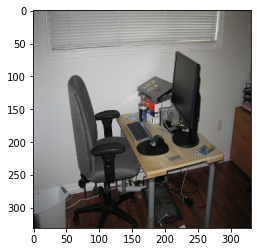

In [72]:
plt.imshow(img)
print(answ1,output[0,output.tolist()[0].index(tempList[-1])])
print(answ2,output[0,output.tolist()[0].index(tempList[-2])])
print(answ3,output[0,output.tolist()[0].index(tempList[-3])])
print(answ4,output[0,output.tolist()[0].index(tempList[-4])])
print(answ5,output[0,output.tolist()[0].index(tempList[-5])])

In [65]:
def answer_me(qwes,image,tokenizer=tokenizer,tokenizer_char=tokenizer_char,tokenizer_onehot=tokenizer_onehot,vqa_model=vqa_model):
    question_numpy = np.empty((1, 23))
    question_charnumpy = np.empty((1, 100))
    question = pad_sequences(tokenizer.texts_to_sequences([qwes]), maxlen=23)
    question_char = pad_sequences(tokenizer_char.texts_to_sequences([qwes]), maxlen=100)
    question_numpy = np.asarray(question)
    question_charnumpy = np.asarray(question_char)
    output=vqa_model.predict([X,question_numpy,question_charnumpy])
    tempList=output.copy()[0]
    tempList.sort()
    answ1=tokenizer_onehot.sequences_to_texts([[np.argmax(output)]])
    plt.imshow(img)
    print(answ1)
    

['no']


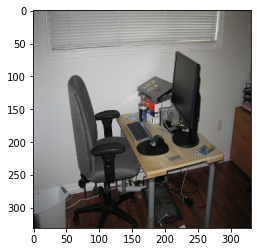

In [66]:
answer_me("Are there any cars?",img)